# Dog Breed Identification using Tensorflow and Transfer Learning

Who's that doggy in the window?

Dogs are incredible. But have you ever been sitting at a cafe, seen a dog and not known what breed it is? I have. And then someone says, "it's an English Terrier" and you think, how did they know that?

In this project we're going to be using machine learning to help us identify different breeds of dogs.

To do this, we'll be using data from the [Kaggle dog breed identification competition](https://www.kaggle.com/c/dog-breed-identification/overview). It consists of a collection of 10,000+ labelled images of 120 different dog breeds.

This kind of problem is called multi-class image classification. It's multi-class because we're trying to classify mutliple different breeds of dog. If we were only trying to classify dogs versus cats, it would be called binary classification (one thing versus another).

Multi-class image classification is an important problem because it's the same kind of technology Tesla uses in their self-driving cars or Airbnb uses in atuomatically adding information to their listings.

Since the most important step in a deep learng problem is getting the data ready (turning it into numbers), that's what we're going to start with.

We're going to go through the following TensorFlow/Deep Learning workflow:

1. Get data ready (download from Kaggle, store, import).
2. Prepare the data (preprocessing, the 3 sets, train,test and validation).
3. Choose and fit/train a model (TensorFlow Hub, tf.keras.applications, TensorBoard, EarlyStopping).
4. Evaluating a model (making predictions, comparing them with the ground truth labels).
5. Improve the model through experimentation (start with 2000 images, make sure it works, increase the number of images).
6. Save, sharing and reloading your model (once you're happy with the results).

# End-to-End Multi-class Dog Breed Classification

This notebook builds an end to end multi class image classifier using Tensorflow 2.0 and Tensorflow Hub

## 1. Problem

Identify the breed of the dog given the image of Dog

## 2. Data

The data we're using from Kaggle's Dog-breed Identification competetion
https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

Evaluation is a file with prediction probablities for each dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* we're dealing with images(unstructured data), so probably it's better to use deep learning/transfer learning.
* There are 120 breeds of dog (this means there 120 different classes)
* There are 10000+ images in the training set (these images have labels)
* There are 10000+ images in the test set (these images does not have labels)



**Note: Mount our own google drive to colab and upload the necessary data in drive**

In [5]:
#Data is downloaded from Kaggle and uploaded to drive and then we are gonna unzip the file as below and store it in same folder

#!unzip "drive/My Drive/Dog vision/dog-breed-identification.zip" -d "drive/My Drive/Dog vision/"

### Getting our workspace ready

* Importing Tensorflow 2.x 
* Importing Tensorflow hub
* Make sure we are using GPU (For better computation)


In [6]:
# Importing necessary tools

import tensorflow as tf
import tensorflow_hub as hub
print('TF version:',tf.__version__)
print('TF Hub version:',hub.__version__)

# Check for GPU availbaility, TF inbuilt will initiate GPU and all codes of TF runs on GPU
print("GPU Available (Yes!!!!)" if tf.config.list_physical_devices("GPU") else "GPU not available")

# If not available Goto Runtime -> change Runtime type -> select GPU

TF version: 2.3.0
TF Hub version: 0.10.0
GPU Available (Yes!!!!)


## Getting our data ready

For any machine Leanring models, our data has to be in numerical format.So that's what we will be doing first.Turning our images into Tensors(numerical representation) which Tensorflow can process

Let's start by accessing our data and checking out the labels


In [7]:
# Checkout the labels of our training data given by kaggle

import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog vision/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     41b02dd6f93364e6dd699ad7a59db8e6  scottish_deerhound
freq                                   1                 126


In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# How many images are there for each breed

labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
briard                   66
eskimo_dog               66
Name: breed, Length: 120, dtype: int64

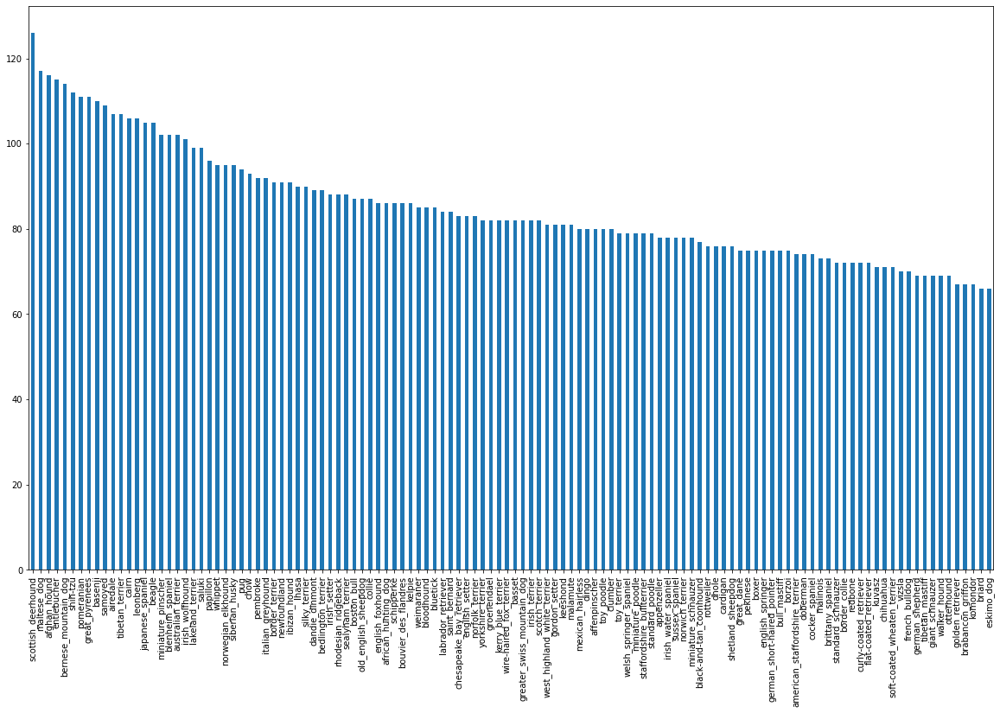

In [10]:
# Let's plot image counts per each breed

labels_csv['breed'].value_counts().plot.bar(figsize=(20,12));

In [11]:
# On average how many images are there for each breed

labels_csv['breed'].value_counts().median()

82.0

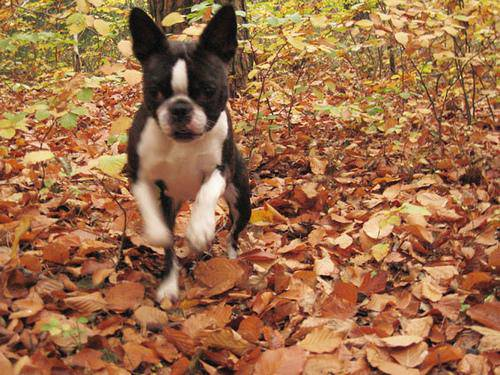

In [8]:
# Let's view an image

from IPython.display import Image
Image('drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

### Getting images and their labels

Let's get a list of all our image file path names

In [12]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [13]:
# create pathnames from image Id's

filenames = ["drive/MyDrive/Dog vision/train/"+ fname + '.jpg' for fname in labels_csv['id']]

# Let's check filenames
filenames[:15],len(filenames)

(['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
  'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
  'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
  'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
  'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
  'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
  'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
  'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
  'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
  'drive/MyDrive/Dog vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
  'drive/MyDrive/Dog vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
  'drive/MyDrive/Dog vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
  'drive/MyDrive/Dog vision/train/006cc3ddb9dc1bd82

In [14]:
#checking whether number of filenames matches with actual image files(train folder)

import os
if len(os.listdir('drive/My Drive/Dog vision/train/')) == len(filenames):
    print("Filenames are matching with actual files..Hurray!!!")
else:
    print("Mismatch in filenames")
    

Filenames are matching with actual files..Hurray!!!


In [15]:
# Example for what os.listdir does?

import os
os.listdir('drive/My Drive/Dog vision/train/')[:10]

['ed894588cade79d0253082f96f2a6310.jpg',
 'ef0ca2e519acbcd5f7f03a97acdf0ef1.jpg',
 'eb40629be9b4a1676e2277d19c43e4b0.jpg',
 'f42afcc1fabac064a07c6a5b7ae2766e.jpg',
 'ed9c22ad21413691f548f5d72e7a76d9.jpg',
 'f23dffefcd4ae2dee8a5dbf67e41b699.jpg',
 'f2caac437e0ad55c130321aac6ba375b.jpg',
 'f069ed4df76d788ff43403f1ba4fa4a8.jpg',
 'f5d4d250dfe2f60b155ec2f40df73936.jpg',
 'eb64bbda1cedd44da3a37c65e4eacb9a.jpg']

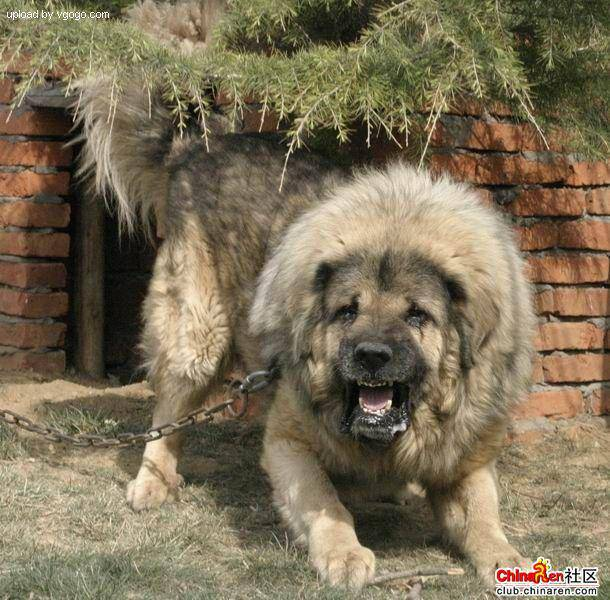

In [13]:
# Let's check one more time for displaying image

Image(filenames[9000])

**Now we have got our training image filepaths in a list, so now let's prepare labels**

In [16]:
# Extracting labels from labels_csv dataframe
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [17]:
len(labels)

10222

In [18]:
# checking whether number of labels matches number of filenames to avoid any missing values

if len(labels) == len(filenames):
    print("Number of labels matches with number of filenames!!!")
else:
    print("Number of labels does not matches number of filenames")

Number of labels matches with number of filenames!!!


In [19]:
# Let's Find the unique label values

unique_breeds = np.unique(labels)
unique_breeds, len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

**Since our machine cannot takes string label as input so we have transform it to boolean or numeric Tensor format**

In [20]:
# Turning a single label into array of booleans

print(labels[0])
labels[0] == unique_breeds  

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [21]:
# Turning every label into boolean array

boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
len(boolean_labels)

10222

In [23]:
# Example for turning boolean array into integers

print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) # Index value where the label is present
print(boolean_labels[0].argmax()) #index value where labels occurs in boolean array
print(boolean_labels[0].astype(int)) # convertin boolean to integer

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

The kaggle has provided only training and test dataset.

But for modelling process, first we have to evaluate our model performance on validation data so further it is helpful to tune the hyper paramters of the model.

Since dataset from kaggle doesn't have validation set. So we will create our own

In [24]:
# Setup X which is pathnames of each image file and y is label for each image

X = filenames
y = boolean_labels

In [23]:
len(filenames)

10222

*we're going to start off experimenting with approximately 2000 images and increase as needed further*

In [25]:
# setting number of images to be used for experimenting

NUM_IMAGES = 2000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [26]:
# Let's split our dataset into train and validation sets

from sklearn.model_selection import train_test_split

# Split them into training and validation sets of total NUM_iMAGES size

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES], test_size=0.1,
                                                random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(1800, 1800, 200, 200)

In [27]:
# Let's look at the training data

X_train[:3], y_train[:2]

(['drive/MyDrive/Dog vision/train/2e3ef941c9d921bf18607e5930f548ee.jpg',
  'drive/MyDrive/Dog vision/train/0cdd66f35d9b7d8b0a98a4d506396c0d.jpg',
  'drive/MyDrive/Dog vision/train/041a54577da744348d4da8094e882cd9.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False,  True, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fa

## Preprocessing Images(Turning images into tensors)

To preprocess our images into tensors we're gonna write a function which does below operations:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it varibale, `image`
3. Turn our `image` (a jpg) into tensors
4. Normalize our image(RGB values from 0-255 to 0-1)
5. Resize the image to a shape of (224,224) 
6. Return the modified `image`

Before we do, let's see what importing an image looks like

In [28]:
# By default images is stored as Numpy array(pixels)

from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape, type(image)  #(height,weidth,color channels)

((257, 350, 3), numpy.ndarray)

In [29]:
image.max(), image.min()

(255, 0)

In [30]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [31]:
#Converting an numpy array to tensor

tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

**Now we've seen what an image looks like a tensor, let's make a function to preprocess them**


In [32]:
# define Image size
IMG_SIZE = 224

# create a function to preprocess images
def process_image(image_path, img_size=IMG_SIZE):
    """
    Takes an image file path and turns image into tensor
    """
    #Read a image file
    image = tf.io.read_file(image_path)
    #Turn the jpeg image into numerical Tensor with 3 colour channels(R,G,B)
    image = tf.image.decode_jpeg(image, channels=3)
    #Convert the color channel values from (0-255) to (0-1)
    image = tf.image.convert_image_dtype(image, tf.float32)  #Normalizing the values for higher efficiency
    #resize our image to desired value(224,224)
    image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])

    return image

In [33]:
# Describing each line in above function for example
tensor = tf.io.read_file(filenames[3])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01X\x01\x90\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [34]:
tensor = tf.image.decode_jpeg(tensor, channels=3)
tensor[:2]

<tf.Tensor: shape=(2, 400, 3), dtype=uint8, numpy=
array([[[70, 66, 63],
        [94, 93, 89],
        [83, 82, 78],
        ...,
        [65, 69, 54],
        [56, 62, 48],
        [48, 56, 43]],

       [[57, 53, 50],
        [92, 91, 87],
        [91, 92, 87],
        ...,
        [46, 48, 34],
        [39, 45, 31],
        [41, 49, 36]]], dtype=uint8)>

In [35]:
tensor = tf.image.convert_image_dtype(tensor, tf.float32)
tensor[:2]

<tf.Tensor: shape=(2, 400, 3), dtype=float32, numpy=
array([[[0.27450982, 0.25882354, 0.24705884],
        [0.36862746, 0.3647059 , 0.34901962],
        [0.3254902 , 0.32156864, 0.30588236],
        ...,
        [0.25490198, 0.27058825, 0.21176472],
        [0.21960786, 0.24313727, 0.18823531],
        [0.18823531, 0.21960786, 0.16862746]],

       [[0.22352943, 0.20784315, 0.19607845],
        [0.36078432, 0.35686275, 0.34117648],
        [0.35686275, 0.36078432, 0.34117648],
        ...,
        [0.18039216, 0.18823531, 0.13333334],
        [0.15294118, 0.1764706 , 0.12156864],
        [0.16078432, 0.19215688, 0.14117648]]], dtype=float32)>

# Turning our data into batches

why to turn our data into batches?

Let's say we are trying to process 10,000+ images in one go....they all might not fit into memory (GPU is not available so much for us)

so that's why we do about 32(this is batch size) images at a time(batch size can be manually adjusted)

In order to use Tensorflow effectively, we need our data in form Tensor tuples like: `(image,labels)`

Refer this article for why batch size 32 is choosen
[Link for Yaan LeCun batch size](https://twitter.com/ylecun/status/989610208497360896?s=20)

In [36]:
# create a function to return tuple (image,label)

def get_image_label(image_path, label):
    """
    Takes an image file path and its associated label,
    process the image and return the tuple(image,label)
    """
    image = process_image(image_path)
    return image,label

In [37]:
# Demo for the above function

(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensor in the form `(image,label)`. Let's turn all of our data `(X and y)` into data batches

In [38]:
#define the batch size, 32 is a good start
BATCH_SIZE = 32

#creating a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches out of image(X) and label(y) pairs
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts the test data as input
    """
    #If data is test dataset, we probably dont have labels
    if test_data:
        print('Creating test data batches....')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths
        data_batch = data.map(process_image).batch(BATCH_SIZE)  #preprocessing the images and dividing into the batches
        return data_batch

    #if it is validation dataset, we dont need to shuffle
    elif valid_data:
        print('Creating validation data batches....')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                                   tf.constant(y))) #labels
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

    else:
        print('Creating training data batches...')
        #turn filepaths and labels into tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                   tf.constant(y)))

        #Shuffling pathnames and labels before mapping image processor is faster than shuffing the images
        data = data.shuffle(buffer_size=len(X)) #shuffles all filenames and labels which are in tensors form

        #create (image,label) tuples and this also turns shuffled image paths and labels into preproccesed images and labels
        data = data.map(get_image_label)

        #Tuning the training data into batches
        data_batch = data.batch(BATCH_SIZE)

        return data_batch



In [39]:
#Create training and validation data batches

train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data=True)



Creating training data batches...
Creating validation data batches....


In [40]:
# Check out different attributes of our data batches 

train_data.element_spec,  valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

**From Above the tuple is represented as (batch_size, height,width,color_channels) for images and tuple is (Batch_size,unique breed counts) for labels.
batch size is None just by default**

## Visualizing the Data batches

Our data is in batches now, this can be little hard to understand/comprehend. Let's visualize them

In [41]:
import matplotlib.pyplot as plt

#create a function for viewing images in batches
def show_25_images(images,labels):
    """
    Displays plot of 25 images and labels from data batch
    """
    #setup the figure
    plt.figure(figsize=(12,12))

    #Loop through 25 images for displaying them
    for i in range(25):
        #create subplots of 5 rows and 5 columns
        ax = plt.subplot(5,5,i+1)
        #display am image
        plt.imshow(images[i])
        # Add label as the title
        plt.title(unique_breeds[labels[i].argmax()])
        # Turn the grid lines off
        plt.axis('off')

In [42]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [43]:
# To get first data batch of the train data

train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels #train_iamges has array of 32 images in tensors and 32 labels in Tensors form

(array([[[[1.32515192e-01, 1.44279897e-01, 1.79574028e-01],
          [1.25059709e-01, 1.36824429e-01, 1.72118545e-01],
          [1.34920850e-01, 1.46685556e-01, 1.81979671e-01],
          ...,
          [1.93826422e-01, 3.35002899e-01, 9.18656439e-02],
          [1.55322105e-01, 2.96498567e-01, 5.33613153e-02],
          [1.42086744e-01, 2.83263206e-01, 4.01259474e-02]],
 
         [[1.48918003e-01, 1.60682708e-01, 1.95976838e-01],
          [1.39316663e-01, 1.51081368e-01, 1.86375499e-01],
          [1.47356138e-01, 1.59120843e-01, 1.94414973e-01],
          ...,
          [1.46359831e-01, 2.87536323e-01, 4.43990529e-02],
          [1.52345911e-01, 2.93522388e-01, 4.47128564e-02],
          [1.43175647e-01, 2.84352124e-01, 3.55425887e-02]],
 
         [[1.82498947e-01, 1.94263667e-01, 2.29557782e-01],
          [1.57668695e-01, 1.69433400e-01, 2.04727530e-01],
          [1.49114013e-01, 1.60878718e-01, 1.96172848e-01],
          ...,
          [1.17517650e-01, 2.58694112e-01, 1.5556

In [44]:
len(train_images), len(train_labels)

(32, 32)

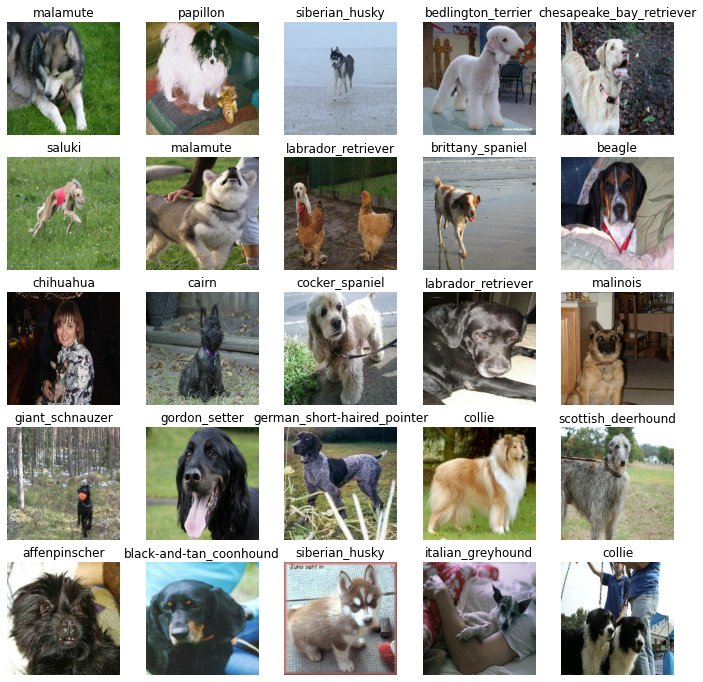

In [45]:
# Now let's visualize first batch of train images

#train_images, train_labels = next(train_data.as_numpy_iterator())  #To get different batch each time on execution
show_25_images(train_images,train_labels) 

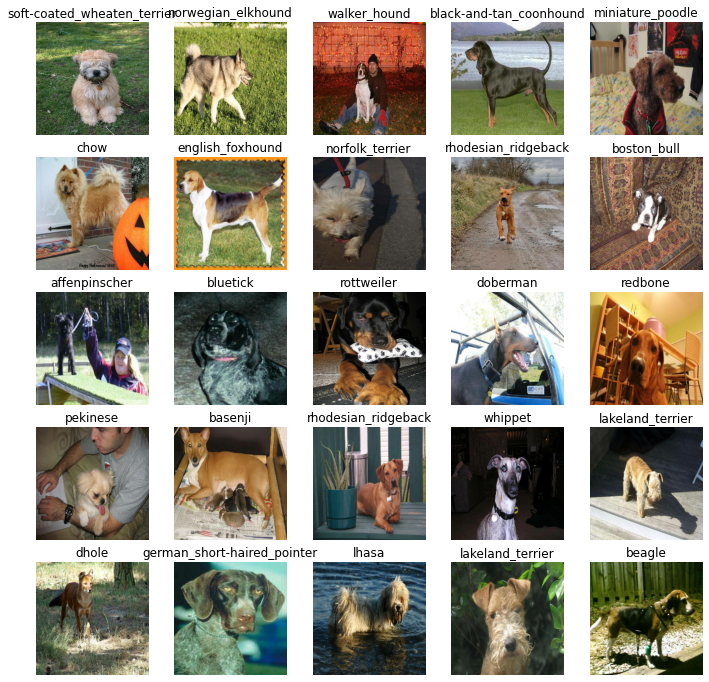

In [46]:
# let's visualize our validation set too
val_images, val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before building our model, we need to define few things:
* The input shape (our image shape in form of Tensors) of our model.
* The output shape (image labels in form of Tensors) of our model.
* Since we are using methodology of Transfer learning,the URL of the model which we want use it from Tensorflow hub

**Note:**
We are gonna train the images using two models and evaluate the performance.

* URL for Model1: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
* URL for Model2: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/4

In [47]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height,width,colour channels

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# setup model URL from Tensorflow Hub
MODEL_1_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"
MODEL_2_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/4"



So now we got our input, output and model ready to go.
Let's put it together into a keras deep learning model.

Knowing this , let's create a function which:
* which takes the input shape, output shape and model we've choosen as parameters.
* Define the layers in keras model in sequential fashion(which means step by step explanation).
* Compiles the model (says it should be evaluated and improved)
* Builds the model(tells the model about input shape)
* returns the model

All of these are explained here: https://www.tensorflow.org/guide/keras/sequential_model

In [48]:
# creating function to build keras model

def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_1_URL):
    print("Building the model....",model_url)

    '''
    # setup model layers
    model = tf.keras.Sequential([
    hub.KerasLayer(model_url), #layer 1(input layer)
    tf.keras.layers.Dense(units=output_shape,
                        activation='softmax') # Layer 2 (output layer) it will be in shape of 120 since 120 breeds
    ])
    '''

    model = tf.keras.Sequential([
    hub.KerasLayer(model_url),
    tf.keras.layers.Dense(1024, activation='relu', name='hidden_layer'),
    tf.keras.layers.Dense(OUTPUT_SHAPE, activation='sigmoid', name='output')
])



    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),  #mostly used optimizer in many models
        metrics=['accuracy']  #parameter to mesaure to prediction is correct or wrong
    )

    # Build the model
    model.build(input_shape)  #This was the input where mobilev2 model is trained ON

    return model


In [62]:
 model_1 = create_model(INPUT_SHAPE, OUTPUT_SHAPE, MODEL_1_URL)
 model_1.summary()

Building the model.... https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_1 (KerasLayer)   (None, 1001)              5432713   
_________________________________________________________________
hidden_layer (Dense)         (None, 1024)              1026048   
_________________________________________________________________
output (Dense)               (None, 120)               123000    
Total params: 6,581,761
Trainable params: 1,149,048
Non-trainable params: 5,432,713
_________________________________________________________________


In [58]:
 model_2 = create_model(INPUT_SHAPE, OUTPUT_SHAPE, MODEL_2_URL)
 model_2.summary()

Building the model.... https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/4
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_1 (KerasLayer)   (None, 1280)              2257984   
_________________________________________________________________
hidden_layer (Dense)         (None, 1024)              1311744   
_________________________________________________________________
output (Dense)               (None, 120)               123000    
Total params: 3,692,728
Trainable params: 1,434,744
Non-trainable params: 2,257,984
_________________________________________________________________


* To know about how to choose model losses.Visit here https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/

* After building model, we found it has trained on 5 Million params which is trained based on imagenet dataset.Refer to model description in Tensorflow hub
* So we take same pattern trainings and apply to our model, its called transfer learning

##  Creating callbacks

Callbacks are helper functions a model can use during training to do things such as save its progress, check its progress or stop training early if model stops improving.

we'll create two callbacks, one for TensorBoard which helps to track our model progress and another for early stopping which prevents our model from training for too long.

#### TensorBoard Callback

To setup a tensorboard callback, we need to do 3 things:
1. Load the tensorboard notebook extension 
2. create a tensorboard callback which is able to save logs to directory and pass it our model's `fit()` function.
3. visualize our model's training logs with the `%tensorboard` magic function(we'll do this after model training).

In [49]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [50]:
import datetime

#create a function to build Tensorboard callback
def create_tensorboard_callback():
    # create a log dictionary for storing Tensorboard logs
    logdir = os.path.join("drive/MyDrive/Dog vision/logs", #Make sure we get the logs whenever we run experiment
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    
    return tf.keras.callbacks.TensorBoard(logdir)
    

### Early stopping callback

Early stopping helps to stop our model from overfitting by stoping the training if certain model metric does not improvize.

Refer for reference: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [51]:
# create early stopping call back

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', #we gonna monitor validation accuracy metric
                                                  patience=3)

## Training a model (on subset of data)

our first model is only going to train on 2000 images, to make sure everything is working fine 

In [52]:
NUM_EPOCHS = 100 #@param {type:'slider',min:10,max:100,step:10}

In [53]:
#check to make sure that we're still running on GPU

print("GPU","Available (Yes!!)" if tf.config.list_physical_devices("GPU") else "Not available")

GPU Available (Yes!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model by passing it the training,validation data, number of epochs to train for and callbacks we like to use.
* Return the model

In [59]:
# Build a function to train and return a trained model
def train_model():
    """
    Trains a given model and return the trained version
    """
    #create a model
    create_model(INPUT_SHAPE, OUTPUT_SHAPE, MODEL_2_URL)

    # create new Tensorboard session everytime we train
    tensorboard = create_tensorboard_callback()

    #Fit the model to data and also passing the callbacks
    model_2.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=valid_data,
              validation_freq=1,
              callbacks=[tensorboard,early_stopping])
    
    return model_2


In [60]:
# Fit the model to data, used model 2 after performing training and found model 2 is best
model = train_model()

Building the model.... https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/4
Epoch 1/100
 1/57 [..............................] - ETA: 0s - loss: 4.8802 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


57/57 [==============================] - 949s 17s/step - loss: 2.8420 - accuracy: 0.3933 - val_loss: 1.1264 - val_accuracy: 0.6800
Epoch 2/100
57/57 [==============================] - 8s 149ms/step - loss: 0.5425 - accuracy: 0.8456 - val_loss: 1.1300 - val_accuracy: 0.7100
Epoch 3/100
57/57 [==============================] - 8s 149ms/step - loss: 0.2258 - accuracy: 0.9339 - val_loss: 0.9854 - val_accuracy: 0.7600
Epoch 4/100
57/57 [==============================] - 8s 149ms/step - loss: 0.1058 - accuracy: 0.9733 - val_loss: 0.8424 - val_accuracy: 0.8000
Epoch 5/100
57/57 [==============================] - 9s 151ms/step - loss: 0.0937 - accuracy: 0.9739 - val_loss: 0.9835 - val_accuracy: 0.7450
Epoch 6/100
57/57 [==============================] - 9s 152ms/step - loss: 0.0428 - accuracy: 0.9883 - val_loss: 0.8563 - val_accuracy: 0.7700
Epoch 7/100
57/57 [==============================] - 9s 152ms/step - loss: 0.0198 - accuracy: 0.9956 - val_loss: 0.9072 - val_accuracy: 0.7750


**From Above, noted points are:**

* 57 Epochs have been reduced since there are total of 1800 training images divided by batch size-32
* The first accuracy corresponds to Training accuracy which becomes 0.9978 in few epochs which means our model has learned full(overfitting)
* The other accuarcy corresponds to validation accuarcy when same val accuarcy is achieved 3 times, early callback steps in and stops the training.

## Checking TensorBoard Logs

The tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents

In [69]:
# Since it is command line, we should not write file path in string

%tensorboard --logdir drive/MyDrive/Dog\ vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using trained model

In [55]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [61]:
#Make predictions on validation data(which is not used for training)

predictions = model.predict(valid_data, verbose=1) #predict only takes valid images from dataset not the output labels
predictions

7/7 [==============================] - 1s 107ms/step


array([[2.80223720e-08, 2.81227985e-05, 9.03319659e-08, ...,
        9.30152282e-07, 1.31625875e-08, 5.13338971e-09],
       [3.53929330e-08, 1.75132819e-09, 1.43789669e-06, ...,
        1.86030547e-06, 1.69762004e-07, 7.00342540e-08],
       [7.85148508e-16, 4.13517831e-12, 1.96517108e-11, ...,
        4.85058993e-10, 3.82616638e-12, 1.81318278e-14],
       ...,
       [1.96838940e-07, 4.18345280e-07, 3.47752433e-07, ...,
        6.80649208e-08, 2.24133334e-09, 2.00902696e-06],
       [7.05657963e-11, 5.31519451e-09, 6.85127843e-10, ...,
        1.99676453e-08, 2.07620934e-10, 8.58502436e-10],
       [6.48425688e-11, 1.90980634e-10, 3.31519989e-09, ...,
        2.23928653e-09, 1.24105060e-10, 1.01328254e-07]], dtype=float32)

In [62]:
predictions[0], len(predictions[0])

(array([2.80223720e-08, 2.81227985e-05, 9.03319659e-08, 3.18954250e-08,
        7.28262872e-09, 6.76288539e-11, 2.37447058e-08, 4.18278789e-09,
        4.28792157e-09, 3.13103099e-09, 6.18775253e-09, 5.01740445e-08,
        6.59663213e-10, 7.05010272e-09, 1.34033246e-06, 9.25141475e-09,
        3.67918446e-10, 2.65907352e-06, 3.75898423e-10, 9.66856151e-10,
        7.72723724e-05, 2.35495872e-08, 6.97486824e-09, 3.01939016e-03,
        7.75542019e-10, 5.10447251e-07, 7.69294638e-06, 3.05245740e-09,
        8.27810993e-08, 3.83974763e-09, 1.17662410e-07, 1.76058297e-08,
        9.67982373e-07, 7.26269889e-08, 8.00626410e-09, 1.13471174e-06,
        3.63392383e-09, 1.41435987e-06, 1.03493996e-08, 1.37434220e-09,
        3.90738791e-07, 1.38589307e-09, 1.11908820e-08, 8.06222733e-09,
        4.92564638e-08, 5.27804733e-09, 1.85409199e-08, 3.77310849e-09,
        1.06151265e-06, 9.97193183e-07, 2.26319052e-09, 4.65985835e-07,
        1.82806481e-08, 1.04167146e-08, 2.51079690e-09, 8.070807

**Above is the predictions of each image with their probabilities of unique breeds(120). So for each image there prediction probabilities for all 120 breeds, the label which has prediction probabilitiy is the final value of respective image**

In [79]:
predictions.shape

(200, 120)

In [80]:
len(y_val)

200

In [81]:
len(unique_breeds)

120

In [63]:
#Let's check one preidiction

index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[8.56230104e-12 2.71638464e-06 1.45189452e-08 1.11886672e-11
 2.15697837e-09 1.15292342e-09 3.78035514e-09 3.62572123e-08
 1.96482430e-09 4.31898917e-09 5.64271545e-08 5.03122821e-10
 3.72036912e-09 5.58820434e-10 2.69024270e-08 1.63836091e-07
 2.86335474e-12 2.99162813e-11 2.18009940e-04 2.73332138e-12
 2.15112365e-13 1.68247541e-10 2.01019995e-12 3.84501542e-10
 1.26022535e-08 1.63466601e-10 2.12606321e-12 2.71118461e-10
 1.29355788e-08 1.46831891e-09 2.05070110e-11 2.62078137e-11
 2.39022635e-10 1.22555888e-09 8.22249158e-10 6.43030898e-12
 9.68814806e-10 9.19541094e-07 2.08998223e-08 2.25087661e-06
 3.97480306e-07 4.69331629e-10 1.14374621e-09 3.18971571e-10
 6.43559730e-08 1.19664879e-12 1.76471546e-11 3.75185927e-09
 1.88066555e-12 6.12619601e-07 1.15854517e-08 4.61663738e-08
 2.85778706e-10 5.14718927e-11 2.61123734e-10 2.09526760e-07
 1.93839664e-08 1.37176792e-09 4.90301411e-10 3.34366890e-09
 3.67672577e-08 2.29983477e-09 1.68070089e-11 3.61205579e-11
 5.37934003e-11 1.242426

Having made the above functionality is great but we want to do it full scale.

And it would even be better if we could see the image which the prediction is being made on.

**Note:** Prediction probablities are also known as confidence levels

In [64]:
# Turn prediction probablity into respective labels which is easier to understand

def get_pred_label(prediction_probabilities):
    """
    Turn the prediction probabilities into a label
    """

    return unique_breeds[np.argmax(prediction_probabilities)]

# get the predicted label bsed on prediction probability
pred_label = get_pred_label(predictions[7])
pred_label


'west_highland_white_terrier'

*Now since we have validation data in batch dataset, we have to unbatch the dataset to make predictions on validation images and compare it with validation labels(truth labels)*

Refer here for unbatching :https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch

In [65]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [66]:
# create a function to unbatchify the dataset
def unbatchify(data):
    """
    Takes an batched dataset of (image,label) tensors and returns the
    separate arrays of image and labels.
    """
    images = []
    labels = []
    for image,label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])

    return images,labels

#unbatchify the validation data
val_images, val_labels = unbatchify(valid_data)
val_images[2], val_labels[2]



(array([[[0.38246724, 0.07297014, 0.04726086],
         [0.39062712, 0.08174372, 0.05572761],
         [0.40063497, 0.09257064, 0.06614499],
         ...,
         [0.233383  , 0.5474501 , 0.14779142],
         [0.10761769, 0.72308797, 0.23498304],
         [0.20519264, 0.8938044 , 0.38021016]],
 
        [[0.6377196 , 0.32331792, 0.26567683],
         [0.6468291 , 0.33520237, 0.27662393],
         [0.66191524, 0.35206753, 0.2928939 ],
         ...,
         [0.20242462, 0.40868193, 0.07352423],
         [0.08734439, 0.52060586, 0.11821178],
         [0.10792284, 0.6009463 , 0.18199496]],
 
        [[0.6035989 , 0.27934292, 0.17156981],
         [0.60704315, 0.284881  , 0.17606099],
         [0.6065856 , 0.29017282, 0.18116546],
         ...,
         [0.21579117, 0.3262139 , 0.06146418],
         [0.08723193, 0.40963793, 0.08839307],
         [0.08911955, 0.4636994 , 0.13247564]],
 
        ...,
 
        [[0.2538499 , 0.19201519, 0.07979528],
         [0.23006025, 0.18454203, 0.06749

In [67]:
val_labels[0], get_pred_label(predictions[0])  #Comparing truth label and predicted label

('soft-coated_wheaten_terrier', 'briard')

Now we've got our ways to get:
* prediction labels
* validation labels(Truth labels)
* validation images

Let's make some function to make these all a bit more visual.

we'll create a function which:
* Takes an array of prediction probabilities, array of truth labels and array of images and an integer
* Convert the predicted probabilities to predicted label
* plot the predicted label,probabilities,the truth label and target image on single plot. 

In [68]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth, image for a sample n
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    #Plot the images and remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the color of title if predicted and truth label is matching or not
    if pred_label == true_label:
        color = 'green'
    else:
        color = 'red'

    #Set the title as (predicted label, prediction precentagem truth label)
    plt.title("{}, {:2.0f}%, {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                      color=color)


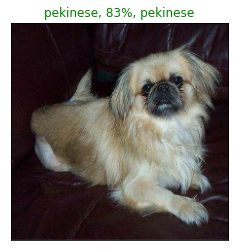

In [69]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=41)


Now we've got a function to visualize our model's top predictions, let's make another to view our model's top 10 predictions for each validation image.

This function will:
* Take an input of prediction probability array, ground truth array and a integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
    * Prediction probability indexes
    * Prediction probability values
    * Prediction labels
* Plot the top 10 prediction value and its labels

In [70]:
def plot_pred_conf(prediction_probabalities, labels, n=1):
    """
    Plot top 10 highest prediction confidences along with truth label for sample n
    """
    pred_prob, true_label = prediction_probabalities[n], labels[n]

    # get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    #Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color='grey')
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation='vertical')
    
    # Change the color of true label
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
        if top_10_pred_labels[0] == true_label:
            plt.title('Correct Prediction')
        else:
            plt.title('Wrong Prediction')
    else:
        pass


In [71]:
# just a example to find top 10 predictions
predictions[0].argsort()[-10:][::-1]  # Returns top 10 prediction indexes which is at bottom of the list

array([ 23, 103,  20,  83,  59,   1,  85, 100,  26, 109])

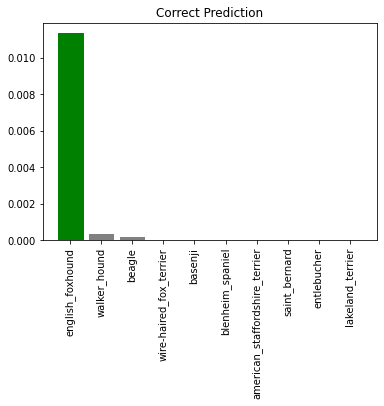

In [72]:
plot_pred_conf(prediction_probabalities=predictions,
               labels=val_labels,
               n=6)

**Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few**

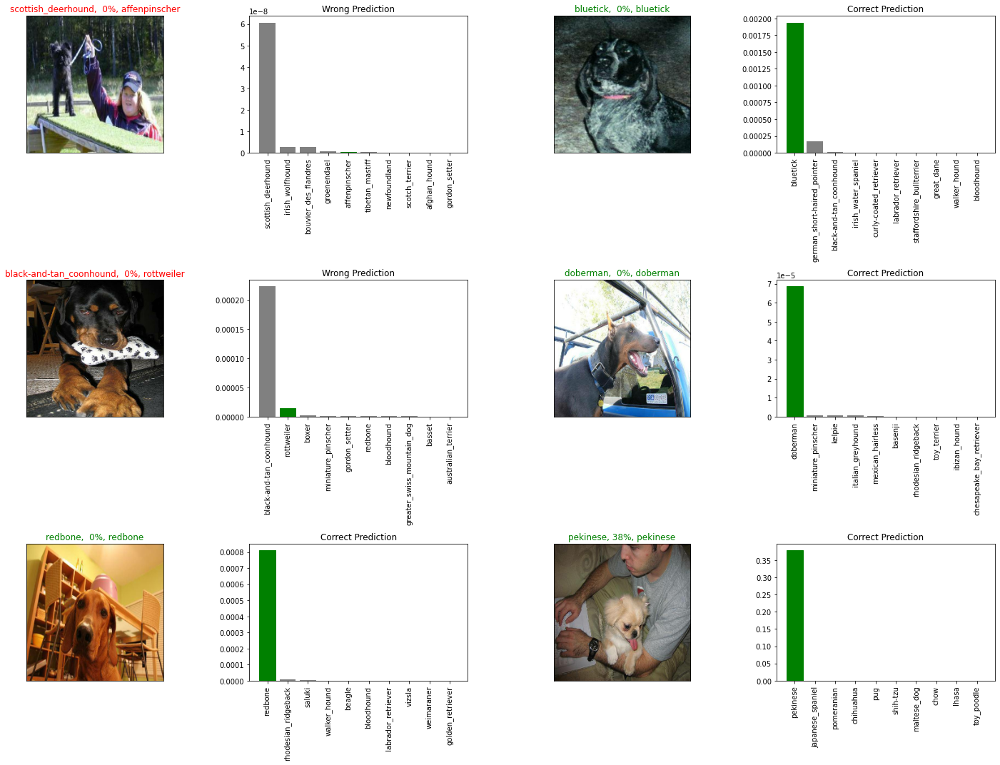

In [73]:
#Let's check out few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabalities=predictions,
                   labels=val_labels,
                   n=i+i_multiplier)
    
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Reloading a Trained Model



In [74]:
# Create a function to save a model
def save_model(model,suffix=None):
    """
    Savea a given model in models directory and appends a suffix(string)
    """
    
    #create a model directory pathname with current time
    modeldir = os.path.join('drive/MyDrive/Dog vision/models',
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    
    model_path = modeldir + "-" + suffix + ".h5" #save the fomat of model .h5 extension
    print(f"Saving model to {model_path}....")
    model.save(model_path)

    return model_path
    


In [75]:
# create a function to load the model
def load_model(model_path):
    """
    Loads the model from saved path
    """
    print(f"Loading the saved model from {model_path}..")
    model = tf.keras.models.load_model(model_path,
                                       custom_objects={'KerasLayer':hub.KerasLayer})  #since we have used tf hub model, we have to mention 
    return model

Now we've got our save and load model functionm,let's make sure that works

In [ ]:
# save our model which is trained on 1000 images
save_model(model, suffix="2000-images-mobilenetv2-featureVector-Adam")

Saving model to drive/MyDrive/Dog vision/models/20201124-07211606202490-2000-images-mobilenetv2-featureVector-Adam.h5....


'drive/MyDrive/Dog vision/models/20201124-07211606202490-2000-images-mobilenetv2-featureVector-Adam.h5'

In [78]:
# Load a trained model
loaded_2000_images_model = load_model('drive/MyDrive/Dog vision/models/20201124-07211606202490-2000-images-mobilenetv2-featureVector-Adam.h5')

Loading the saved model from drive/MyDrive/Dog vision/models/20201124-07211606202490-2000-images-mobilenetv2-featureVector-Adam.h5..


In [76]:
# Let's check
model.evaluate(valid_data)

7/7 [==============================] - 1s 92ms/step - loss: 0.9072 - accuracy: 0.7750


[0.9072406888008118, 0.7749999761581421]

In [79]:
loaded_2000_images_model.evaluate(valid_data)

7/7 [==============================] - 1s 95ms/step - loss: 0.9169 - accuracy: 0.7700


[0.9168785810470581, 0.7699999809265137]

# Training large dog vision model (on the full dataset)

Currently our model was trained only on 1800 images

In [80]:
len(X), len(y)

(10222, 10222)

In [81]:
X[:5], y[:2]

(['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
  'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
  'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
  'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

In [82]:
# create a data batch set with full data

full_data = create_data_batches(X,y)

Creating training data batches...


In [83]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [84]:
# create a model for full dataset

full_model = create_model(INPUT_SHAPE,OUTPUT_SHAPE,MODEL_2_URL)

Building the model.... https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/4


In [85]:
#creating full model callbacks
full_model_tensorboard = create_tensorboard_callback()

#Since there is no validation set, we're training on whole dataset so we cant monitor the validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note:** Running the below cell will take a little while (may be more than 40 mins for first epoch) because we're using GPU in the run time has to load all the 10,222 images into memory.

In [ ]:

# Fit the model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               verbose=1,
               callbacks=[full_model_tensorboard,full_model_early_stopping])


Epoch 1/100
320/320 [==============================] - 2915s 9s/step - loss: 1.2840 - accuracy: 0.6653
Epoch 2/100
320/320 [==============================] - 40s 124ms/step - loss: 0.4757 - accuracy: 0.8477
Epoch 3/100
320/320 [==============================] - 40s 126ms/step - loss: 0.2804 - accuracy: 0.9019
Epoch 4/100
320/320 [==============================] - 39s 122ms/step - loss: 0.1956 - accuracy: 0.9317
Epoch 5/100
320/320 [==============================] - 39s 123ms/step - loss: 0.1436 - accuracy: 0.9457
Epoch 6/100
320/320 [==============================] - 40s 124ms/step - loss: 0.1192 - accuracy: 0.9599
Epoch 7/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0940 - accuracy: 0.9659
Epoch 8/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0839 - accuracy: 0.9704
Epoch 9/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0663 - accuracy: 0.9774
Epoch 10/100
320/320 [==============================] - 39s 122ms

In [ ]:
save_model(full_model, suffix="full-imageset-mobilenetv2-featureVector-Adam")  # when early stopping callback is completed, this automatically saves the model

Saving model to drive/MyDrive/Dog vision/models/20201124-08421606207351-full-imageset-mobilenetv2-featureVector-Adam.h5....


'drive/MyDrive/Dog vision/models/20201124-08421606207351-full-imageset-mobilenetv2-featureVector-Adam.h5'

In [87]:
# Loading the full model
loaded_full_model = load_model('drive/MyDrive/Dog vision/models/20201120-10061605866807-full-imageset-mobilenetv2-Adam.h5')


In [88]:
loaded_full_model_2 = load_model('drive/MyDrive/Dog vision/models/20201124-08421606207351-full-imageset-mobilenetv2-featureVector-Adam.h5')

Loading the saved model from drive/MyDrive/Dog vision/models/20201124-08421606207351-full-imageset-mobilenetv2-featureVector-Adam.h5..


## Making predictions on Test dataset

Since our model has been trained on images in the form of Tensor batches,so to make predictions on test data. we have to convert test data into same format.

Luckily we've created `create_data_batches()` earlier which can take input as filenames and convert it to data batches.

To make predictions on test data, we will:
* Get the test images filenames
* convert the test image filenames into data batches
* Make a predictions array by passing test batches to the `predict()` method to our model.

In [89]:
 # Load the test image filenames
 test_path = "drive/MyDrive/Dog vision/test/"
 test_filenames = [test_path + fname for fname in os.listdir(test_path)]
 test_filenames[:5]

['drive/MyDrive/Dog vision/test/eebf49093e7b0c603ee4c8d67d061352.jpg',
 'drive/MyDrive/Dog vision/test/f310b89d1a4706733a71054a26e7fb06.jpg',
 'drive/MyDrive/Dog vision/test/e8232c9a79f0e77e9b4c5fca60682d41.jpg',
 'drive/MyDrive/Dog vision/test/edf164f8974510c5936ee7224f3d7d56.jpg',
 'drive/MyDrive/Dog vision/test/eda4e3377eb5ad8a73026c08c76a613d.jpg']

In [90]:
len(test_filenames)

10357

In [91]:
# create test data batches
test_data = create_data_batches(test_filenames, test_data=True)
test_data

Creating test data batches....


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling `predict()` function on our full model and passing it the test data batch will take long time to run (about ~1 hour) and test data contains 10,000+ images

In [ ]:
# make predictions on test data batches using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 6450s 20s/step


In [ ]:
# Save predictions (Numpy array) to csv file for future access
#np.savetxt('drive/MyDrive/Dog vision/preds_array.csv',test_predictions,delimiter=",")

In [92]:
# Loads predictions (numpy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/Dog vision/preds_array.csv',delimiter=",")

In [93]:
test_predictions[:10], test_predictions.shape

(array([[0.00878181, 0.00037611, 0.00101435, ..., 0.00027577, 0.00272638,
         0.00212219],
        [0.00345509, 0.001662  , 0.00018649, ..., 0.00348522, 0.00838226,
         0.00792679],
        [0.00410981, 0.00262337, 0.0011049 , ..., 0.00110752, 0.00128631,
         0.0143981 ],
        ...,
        [0.00019848, 0.00248875, 0.02485127, ..., 0.00848198, 0.00149529,
         0.00166129],
        [0.00240865, 0.02317895, 0.00071077, ..., 0.00902082, 0.01239322,
         0.0026813 ],
        [0.00282748, 0.00637774, 0.00308508, ..., 0.0011477 , 0.00147394,
         0.00119511]]), (10357, 120))

## Prepaing test dataset presdictions for kaggle

From kaggle's evaluation, the test dataset predictions submissions should be a csv file which contains Id,breeds name and their corresponding prediction probabilities.

Refer here for more https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a Pandas Dataframe with an ID column as well as column for each dog breed.
* Add data to ID column by extracting the filenames.
* Add data (prediction probabilities) to each one of dog breeds
* Export the Dataframe as csv to submit it to kaggle


In [94]:
# create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [95]:
# Append test image Id's to predictions dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [96]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,eebf49093e7b0c603ee4c8d67d061352,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f310b89d1a4706733a71054a26e7fb06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e8232c9a79f0e77e9b4c5fca60682d41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,edf164f8974510c5936ee7224f3d7d56,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,eda4e3377eb5ad8a73026c08c76a613d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,eebf49093e7b0c603ee4c8d67d061352,0.00878181,0.000376113,0.00101435,0.0119853,0.00226919,0.00300081,0.00125183,0.00453358,0.00351782,0.00815821,0.00532861,0.0108152,0.00260765,0.0103887,0.0238127,0.0107567,0.00313964,0.00999944,0.00431687,0.00731686,0.00189032,0.0565816,0.00216725,0.00270135,0.0119718,0.0229589,0.00236924,0.00376385,0.00490098,0.00746793,0.00107439,0.0020181,0.0264592,0.0165197,0.00465299,0.00724113,0.000967268,0.00264317,0.0285943,...,0.00118206,0.00276014,0.000592532,0.00247211,0.0105945,0.000554066,0.0189348,0.00235672,0.00284257,0.00137893,0.0120196,0.00511111,0.00414989,0.00467497,0.00469218,0.00357756,0.000641257,0.00958053,0.00249187,0.013648,0.000451138,0.00582049,0.00544271,0.000332862,0.0541667,0.00256902,0.00489432,0.00240482,0.000593369,0.00812702,0.00377995,0.0109879,0.000994937,0.0162673,0.00144013,0.00168576,0.0107617,0.000275765,0.00272638,0.00212219
1,f310b89d1a4706733a71054a26e7fb06,0.00345509,0.001662,0.000186487,0.00832307,0.00145162,0.000593105,0.0022331,0.0344957,0.0544795,0.000691233,0.000435895,0.000970272,0.035612,0.00507285,0.000271722,0.00292524,0.00565526,0.000405617,0.00104662,0.00135347,0.00369281,0.00207536,0.00131244,0.0022998,0.00964536,0.00420784,0.00110708,0.00544675,0.00663797,0.00179265,0.00301794,0.0176777,0.011561,0.00209886,0.000481536,0.00168342,0.00326347,0.00324119,0.0464508,...,0.00147322,0.00743903,0.00128745,0.00752835,0.00209181,0.016352,0.00451974,0.00533343,0.000117989,0.00770668,0.00501834,0.00538219,0.00322502,0.00215613,0.00248735,0.00975434,0.00261593,0.00175363,0.00130015,0.0775452,0.00136858,0.000122698,0.069882,0.0129752,0.00757711,0.000345187,0.0122511,0.00469921,0.00110206,0.00514103,0.00427085,0.00903298,0.00163714,0.00256833,0.00431001,0.00156377,0.0037156,0.00348522,0.00838226,0.00792679
2,e8232c9a79f0e77e9b4c5fca60682d41,0.00410981,0.00262337,0.0011049,0.00305126,0.000281591,0.00513276,0.00226057,0.00154258,0.00446506,0.000762607,0.000866521,0.00228789,0.0133438,0.00232982,0.0115834,0.000871437,0.000650464,0.00711875,0.0316217,0.00561909,0.00377651,0.0170645,0.00208363,0.00201537,0.00211706,0.00650696,0.000366339,0.00542184,0.00249731,0.00314015,0.00178538,0.0166116,0.00592463,0.00723404,0.0122393,0.00425505,0.0078016,0.00328606,0.098296,...,0.00104425,0.00245011,0.00924303,0.00885664,0.00218677,0.00594001,0.00383967,0.0323077,0.000726614,0.00138225,0.000691264,0.00314329,0.000542324,0.00341344,0.00382936,0.0214764,0.0034437,0.0308801,0.00537039,0.0210363,0.00556968,0.0038444,0.0486566,0.0142164,0.0152333,0.00187279,0.00472428,0.00294064,0.00176195,0.00186014,0.00220893,0.00023699,0.00687914,0.0026737,0.00028833,0.00348735,0.00572738,0.00110752,0.00128631,0.0143981
3,edf164f8974510c5936ee7224f3d7d56,0.00291257,0.000304988,0.00147355,0.0492945,0.000481683,0.0134086,0.0486178,0.00381114,0.0387951,0.00508347,0.00177937,0.00108402,0.0189921,0.000575627,0.0195379,0.

In [ ]:
# save our predictions dataframe to csv file
preds_df.to_csv('drive/MyDrive/Dog vision/full_model_predictions_submission_1.csv',index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images (downloaded 4 images from google)
* Turn the filepaths into data batches using `create_data_batches()` and our custom images wont have labels.
* Pass the customer image databatch to model's `predict()` method.
* Convert the prediction probabilities to predictions labels and compare them with custom images

In [98]:
# Get custom image filepaths
custom_path  = "drive/MyDrive/Dog vision/custom-dog-images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/Dog vision/custom-dog-images/german_shepherd.jpg',
 'drive/MyDrive/Dog vision/custom-dog-images/Golden_retriever.jpg',
 'drive/MyDrive/Dog vision/custom-dog-images/Pomernian_1.jpg',
 'drive/MyDrive/Dog vision/custom-dog-images/Pomernian_2.jpg']

In [99]:
# Turn custom images into data batches

custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches....


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [101]:
# MAke predictions on custom data

custom_predictions = loaded_full_model_2.predict(custom_data)
custom_predictions

array([[8.34642046e-17, 7.64684260e-10, 3.17209157e-07, 2.12148593e-12,
        1.94534444e-16, 2.99927509e-13, 1.23126097e-06, 4.21309953e-14,
        2.04804791e-14, 1.96770505e-16, 1.16081393e-13, 1.23101867e-11,
        5.66458382e-12, 5.38460119e-13, 2.60183395e-08, 3.10706783e-13,
        1.41652081e-11, 1.20165488e-13, 1.64366498e-09, 1.61958378e-13,
        1.86500641e-11, 3.06933188e-15, 2.26669798e-13, 1.30453892e-03,
        6.87719142e-13, 4.16625205e-08, 2.05855583e-10, 2.71834665e-13,
        5.74613870e-14, 3.28920444e-14, 2.74940792e-10, 2.42391307e-12,
        7.18700679e-15, 4.73532168e-07, 6.18054398e-17, 1.12606010e-11,
        2.10486226e-10, 1.16101995e-09, 6.71121936e-10, 5.78896740e-13,
        3.19475078e-14, 2.17216636e-14, 1.59869527e-13, 3.30951690e-11,
        1.86143479e-11, 5.53860170e-12, 8.27921212e-01, 2.87949041e-15,
        2.90012589e-12, 2.15625337e-10, 1.50368418e-09, 1.57102595e-11,
        4.09729126e-11, 1.10723132e-10, 4.60292782e-09, 1.332817

In [102]:
custom_predictions.shape

(4, 120)

In [103]:
# Get custom image prediction label
custom_pred_labels = [get_pred_label(custom_predictions[i]) for i in range(len(custom_predictions))]
custom_pred_labels

['german_shepherd', 'golden_retriever', 'pomeranian', 'pomeranian']

In [104]:
#unbtach the data and data only has images no labels

custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)
    

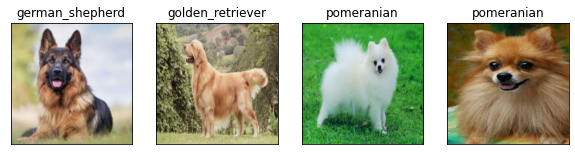

In [105]:
# check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
    plt.subplot(1,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)

## The END

We have got correct predictions for our custom images!!!

Model can be improved further by any of below methods:
* Changing the model
* Data augmentation(rotating the images,changing background of iamges etc..)
* Gathering more training images
* Increasing the number of hidden layers